In [265]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib as mpl
import math

In [267]:
gray_img = cv2.imread("AE.jpg",cv2.IMREAD_GRAYSCALE)
bgr_img = cv2.imread("tulips.jpg")

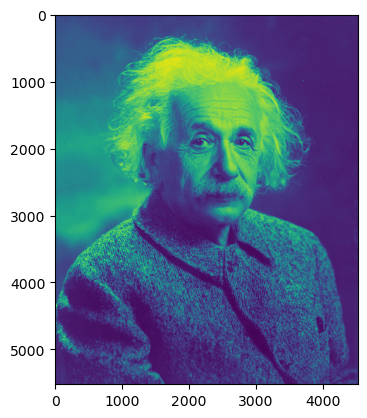

In [268]:
plt.imshow(gray_img)

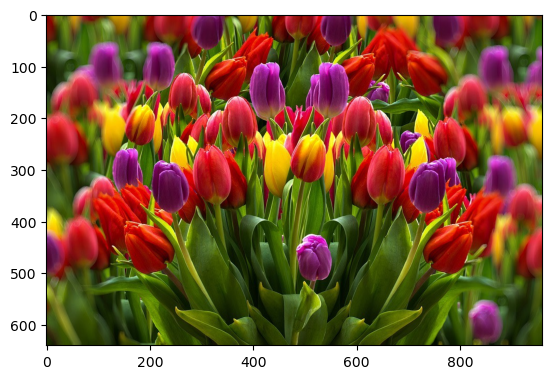

In [269]:
plt.imshow(bgr_img[:,:,::-1])  ## Reversing the order of channels

In [270]:
gray_img_resized = cv2.resize(src=gray_img,fx = 2,fy=0.5,dsize=None)  ## fx for width and fy for height

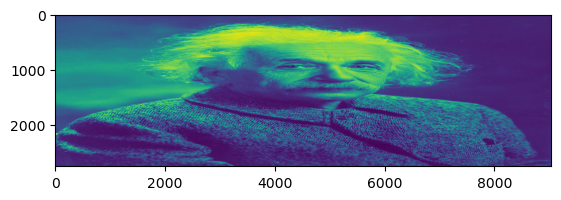

In [271]:
plt.imshow(gray_img_resized)

In [272]:
gray_img.shape

(5522, 4517)

In [274]:
gray_img_resized.shape

(2761, 9034)

In [275]:
bgr_img_resized = cv2.resize(src=bgr_img,fx=0.5,fy=2,dsize=None)

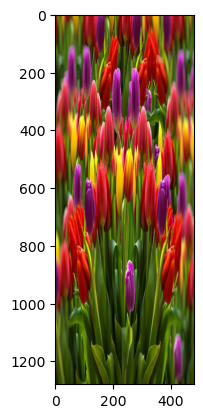

In [276]:
plt.imshow(bgr_img_resized[:,:,::-1])

In [277]:
bgr_img_zoomed = cv2.resize(src=bgr_img,fx=2,fy=2,dsize=None)

In [278]:
gray_new = cv2.imread("tulips.jpg",cv2.IMREAD_GRAYSCALE)

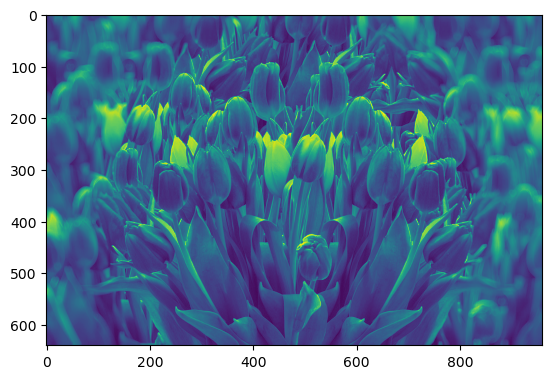

In [279]:
plt.imshow(gray_new)

In [280]:
numRows = gray_new.shape[0]
numCols = gray_new.shape[1]

In [281]:
print(numRows,numCols)

640 960


In [282]:
gray_new_copy = np.zeros((numRows,numCols),dtype='uint8')

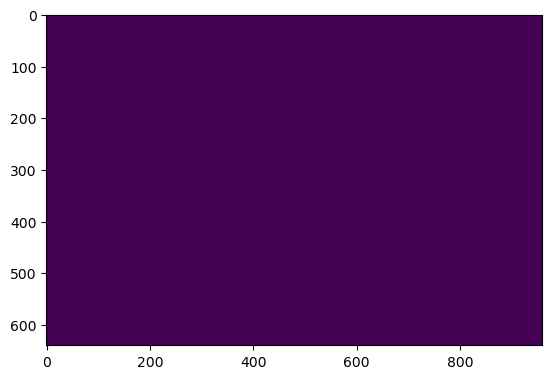

In [283]:
plt.imshow(gray_new_copy)

In [284]:
for i in range(numRows):
    for j in range(numCols):
        gray_new_copy[i,j] = gray_new[i,j]

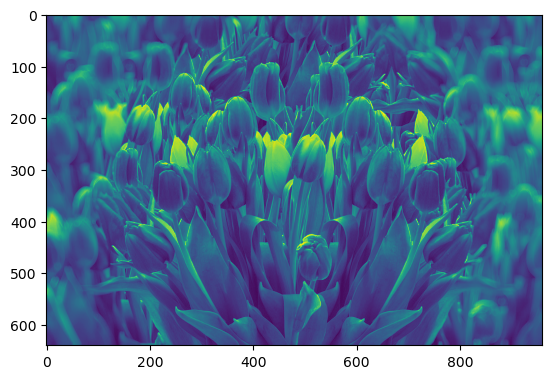

In [285]:
plt.imshow(gray_new_copy)

In [286]:
## Flippin image vertically
for i in range(numRows):
    for j in range(numCols):
        gray_new_copy[numRows-i-1,j] = gray_new[i,j]

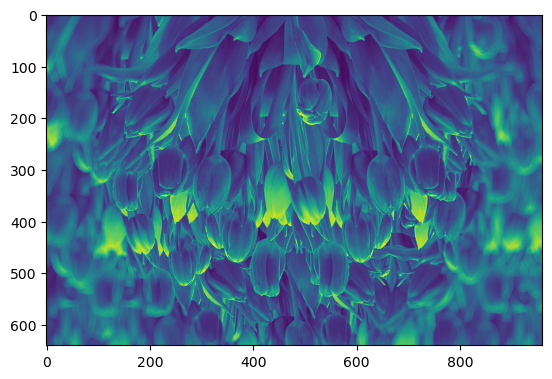

In [287]:
plt.imshow(gray_new_copy)

In [288]:
### To crop image 
gray_new_cropped = np.zeros((numRows//2,numCols),dtype='uint8')
for i in range(numRows//2):
    for j in range(numCols):
        gray_new_cropped[i,j] = gray_new[i,j]

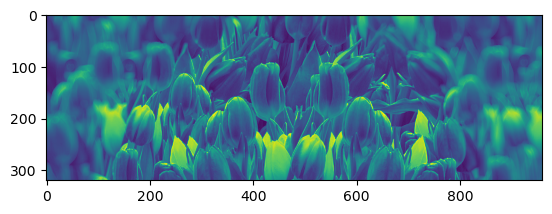

In [289]:
plt.imshow(gray_new_cropped)

In [290]:
## Flipping image horizontally
ncols = gray_img.shape[1]
nrows = gray_img.shape[0]
gray_img_copy = np.zeros((nrows,ncols),dtype='uint8')
for i in range(nrows):
    for j in range(ncols):
        gray_img_copy[i,j] = gray_img[i,ncols-j-1]

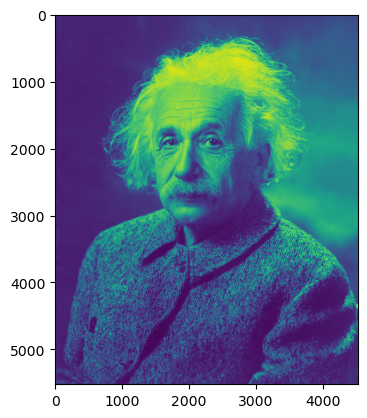

In [291]:
plt.imshow(gray_img_copy)

In [292]:
gray_img.shape

(5522, 4517)

In [293]:
s = np.array([[2,0],[0,2]])

In [294]:
i2 = np.zeros((2*numRows,2*numCols),dtype="uint8")

In [295]:
for i in range(numRows):
    for j in range(numCols):
        P = np.array([i,j])  ## Original Coordinates
        P_dash = s.dot(P)
        new_i,new_j = P_dash[0],P_dash[1]  ## New Points
        i2[new_i,new_j] = gray_new[i,j]   

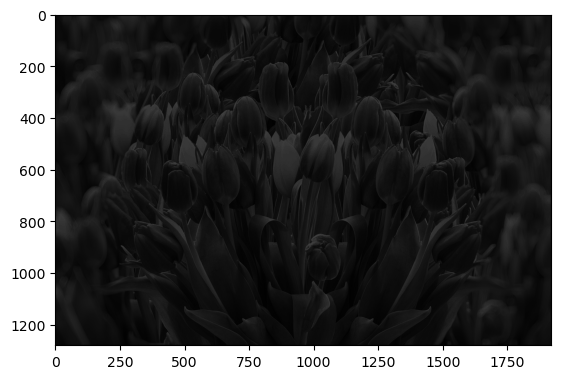

In [296]:
plt.imshow(i2,cmap="grey")  ## It will be not showing the effect of holes when we are using matplotlib

In [297]:
i2.shape

(1280, 1920)

In [358]:
def displayImageInActualSize(I):
    dpi = mpl.rcParams['figure.dpi']
    if I.ndim == 2:  # Grayscale
        H, W = I.shape
    elif I.ndim == 3:  # RGB or RGBA
        H, W, _ = I.shape
    figsize = W/float(dpi),H/float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0,0,1,1])
    ax.axis("off")
    ax.imshow(I,cmap="gray")
    plt.show()

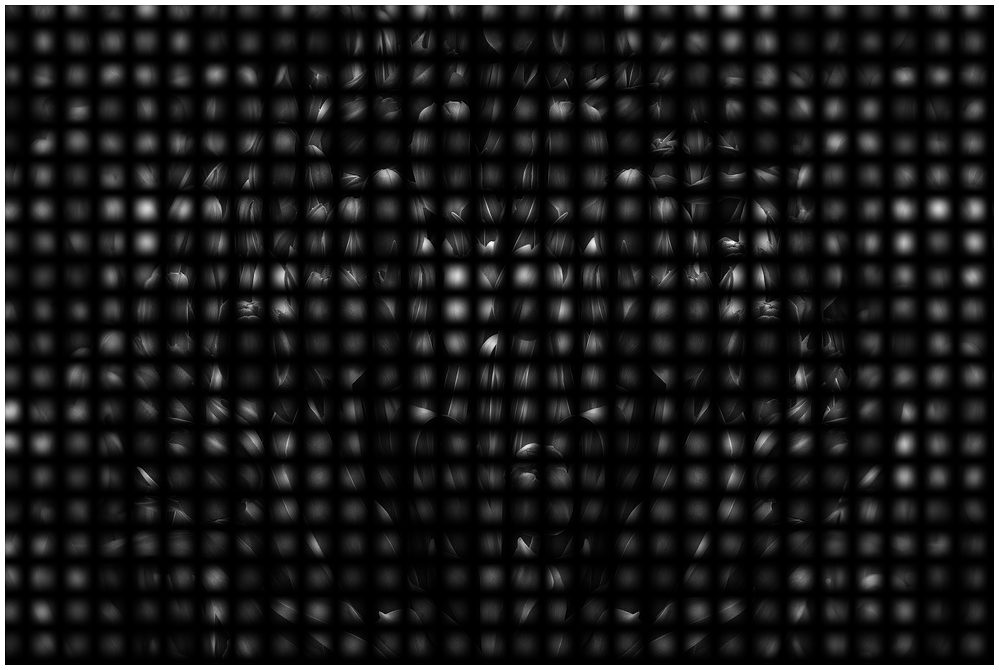

In [299]:
displayImageInActualSize(i2)

In [300]:
s = np.array([[2,0],[0,2]])
i2 = np.zeros((2*numRows,2*numCols),dtype="uint8")
T_inv = np.linalg.inv(s)
for i in range(i2.shape[0]):
    for j in range(i2.shape[1]):
        P_dash = np.array([i,j])  ## Original Coordinates
        P = T_inv.dot(P_dash)
        P = np.int16(np.floor(P))
        new_i,new_j = P[0],P[1]  ## New Points
        i2[i,j] = gray_new[new_i,new_j]   

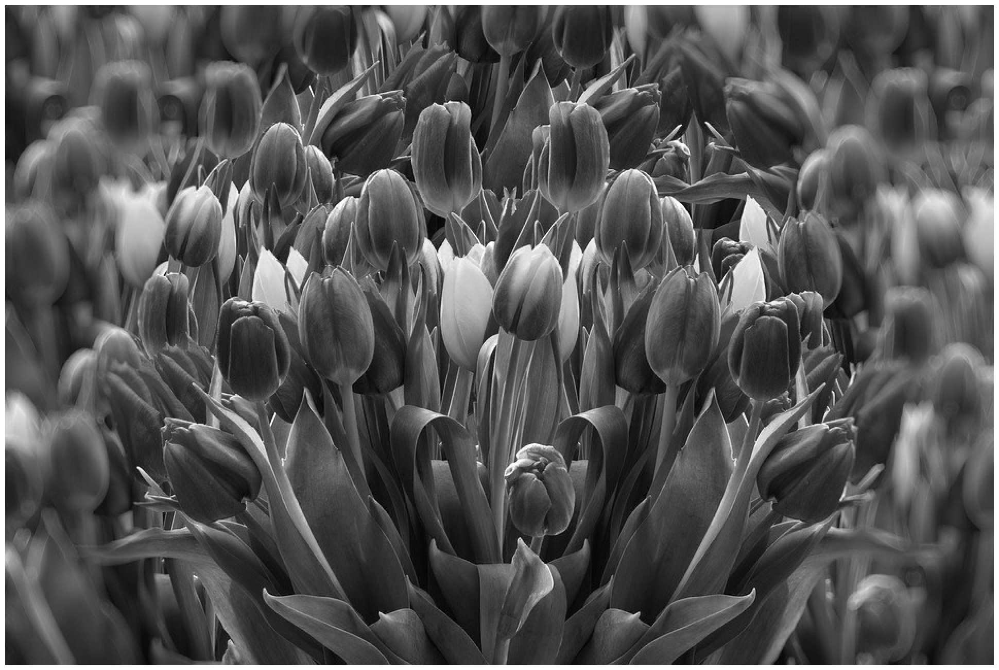

In [301]:
displayImageInActualSize(i2) #Images with holes look darker than inverse scaled image and its because we initiated our image with zeroes which is also the color of black and where there is black there is hole

In [302]:
s = np.array([[2,0],[0,2]])
i2 = np.zeros((2*numRows,2*numCols),dtype="uint8")
T_inv = np.linalg.inv(s)
for i in range(i2.shape[0]):
    for j in range(i2.shape[1]):
        P_dash = np.array([i,j])  ## Original Coordinates
        P = T_inv.dot(P_dash)
        P = np.int32(np.round(P))
        new_i,new_j = P[0],P[1]  ## New Points
        if 0 <= new_i < numRows and 0 <= new_j < numCols:
            i2[i, j] = gray_new[new_i, new_j]

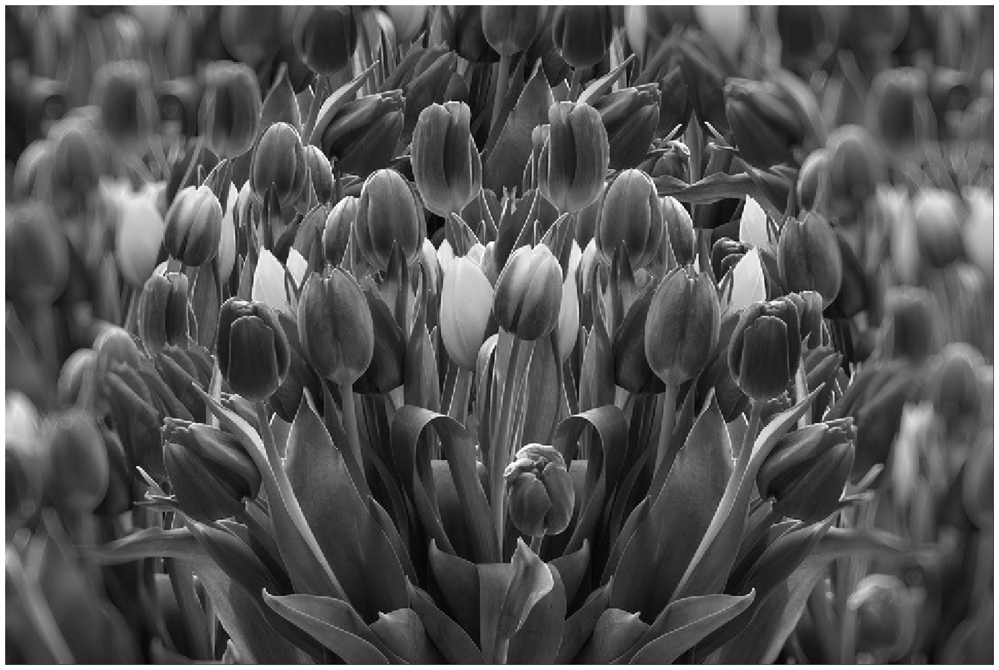

In [303]:
displayImageInActualSize(i2) ## The last column and last row of the scaled/enlarged image will likely remain zero (i.e., black), if their inverse-mapped coordinates fall outside the original image.

In [304]:
i2[:,2*numCols-1]

array([0, 0, 0, ..., 0, 0, 0], dtype=uint8)

In [305]:
a = gray_new
s = np.array([[2,0],[0,2]])
i3 = np.zeros((2*numRows,2*numCols),dtype="uint8")
T_inv = np.linalg.inv(s)
for i in range(i3.shape[0]):
    for j in range(i3.shape[1]):
        P_dash = np.array([i,j])  ## Original Coordinates
        P = T_inv.dot(P_dash)
        x, y = P[0], P[1]
        x_floor = int(math.floor(x))
        x_ceil = min( a.shape[0] - 1, math.ceil(x))
        y_floor = int(math.floor(y))
        y_ceil = min( a.shape[1] - 1, math.ceil(y))
        #get the neighbouring pixel values
        v1 = a[x_floor, y_floor]
        v2 = a[x_ceil, y_floor]
        v3 = a[x_floor, y_ceil]
        v4 = a[x_ceil, y_ceil]
        if (x_ceil == x_floor) and (y_ceil == y_floor):
            q = a[int(x), int(y)]
        elif (x_ceil == x_floor):
            q1 = a[int(x), int(y_floor)]
            q2 = a[int(x), int(y_ceil)]
            q = q1 * (y_ceil - y) + q2 * (y - y_floor)
        elif (y_ceil == y_floor):
            q1 = a[int(x_floor), int(y)]
            q2 = a[int(x_ceil), int(y)]
            q = (q1 * (x_ceil - x)) + (q2 * (x - x_floor))
        else:
            v1 = a[x_floor, y_floor]
            v2 = a[x_ceil, y_floor]
            v3 = a[x_floor, y_ceil]
            v4 = a[x_ceil, y_ceil]
            
            q1 = v1 * (x_ceil - x) + v2 * (x - x_floor)
            q2 = v3 * (x_ceil - x) + v4 * (x - x_floor)
            q = q1 * (y_ceil - y) + q2 * (y - y_floor)
        i3[i,j] = q

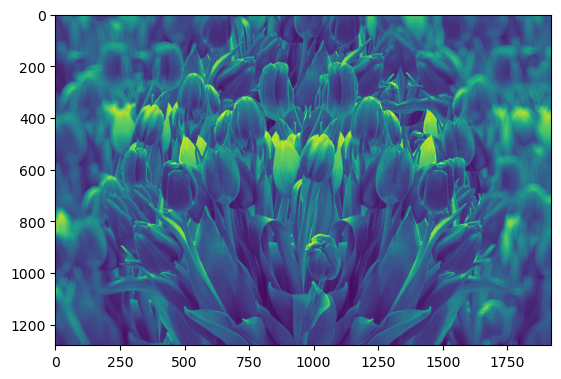

In [306]:
plt.imshow(i3)

In [362]:
a = bgr_img[:,:,::-1]
s = np.array([[2,0],[0,2]])
i3 = np.zeros((2*numRows,2*numCols,3),dtype="uint8")
T_inv = np.linalg.inv(s)
for i in range(i3.shape[0]):
    for j in range(i3.shape[1]):
        P_dash = np.array([i,j])  ## Original Coordinates
        P = T_inv.dot(P_dash)
        x, y = P[0], P[1]
        x_floor = int(math.floor(x))
        x_ceil = min( a.shape[0] - 1, math.ceil(x))
        y_floor = int(math.floor(y))
        y_ceil = min( a.shape[1] - 1, math.ceil(y))
        #get the neighbouring pixel values
        if (x_ceil == x_floor) and (y_ceil == y_floor):
            q = a[int(x), int(y),:]
        elif (x_ceil == x_floor):
            q1 = a[int(x), int(y_floor),:]
            q2 = a[int(x), int(y_ceil),:]
            q = q1 * (y_ceil - y) + q2 * (y - y_floor)
        elif (y_ceil == y_floor):
            q1 = a[int(x_floor), int(y),:]
            q2 = a[int(x_ceil), int(y),:]
            q = (q1 * (x_ceil - x)) + (q2 * (x - x_floor))
        else:
            v1 = a[x_floor, y_floor,:]
            v2 = a[x_ceil, y_floor,:]
            v3 = a[x_floor, y_ceil,:]
            v4 = a[x_ceil, y_ceil,:]
            
            q1 = v1 * (x_ceil - x) + v2 * (x - x_floor)
            q2 = v3 * (x_ceil - x) + v4 * (x - x_floor)
            q = q1 * (y_ceil - y) + q2 * (y - y_floor)
        i3[i,j,:] = q

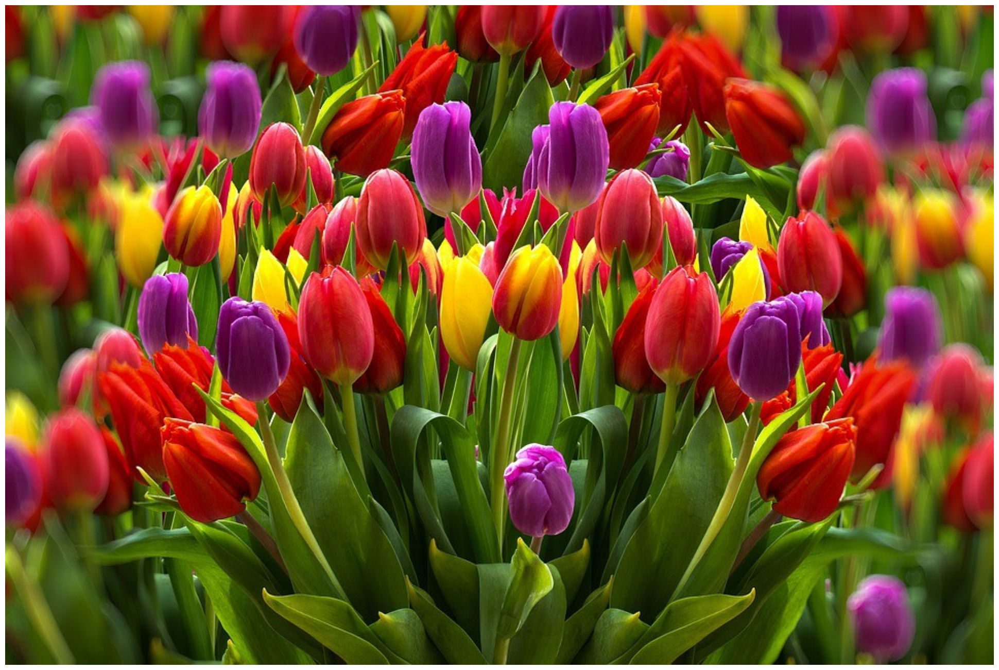

In [364]:
displayImageInActualSize(i3)